In [83]:
from glob import glob
from numba import jit, njit
import numpy as np
import imageio
from skimage.util import view_as_blocks
import scipy as sp
import scipy.ndimage
from matplotlib import pyplot as plt
import seaborn as sns
from pcr import downsample_block

In [89]:
paths = glob("example_images/*")
imgs = []
for path in paths:
    img = imageio.imread(path) / 255
    if img.ndim == 3:
        img = img.mean(axis=-1)
    imgs.append(img.copy())

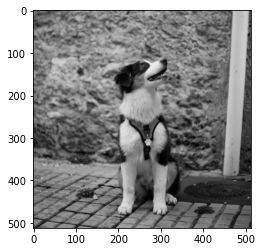

In [81]:
img = imageio.imread("example_img.png").mean(axis=-1)/255
# img = imageio.imread("example_target.png")/255
plt.imshow(img, cmap='gray', vmin=0, vmax=1)

In [16]:
scales = []
tmp = img.copy()
for scale in range(5):
    scales.append(tmp.copy())
    tmp = downsample_block(tmp, 1.4)
    #plt.imshow(tmp, cmap='gray', vmin=0, vmax=1)
    #plt.show()

In [35]:
max_dist = 4
min_samples = 20
contrast_k = 100
light_k = 100
contrasts = np.linspace(0, 1, contrast_k)
lights = np.linspace(0, 1, light_k)

In [36]:
Y, X = img.shape

In [49]:
def get_contrast_histogram(img, max_dist=8, contrast_k=100, light_k=100):
    contrasts = np.linspace(0, 1, contrast_k)
    lights = np.linspace(0, 1, light_k)
    histogram = np.zeros((contrast_k, light_k), int)
    dists = ([(x, y) for x in range(max_dist+1) for y in range(max_dist+1) if (x or y) and (x**2 + y**2 <= max_dist**2)])
    _fill_histogram(img, histogram, dists, max_dist, contrast_k, light_k)
    return histogram

@njit
def _fill_histogram(img, histogram, dists, max_dist, contrast_k, light_k):
    Y, X = img.shape
    for y in range(Y):
        for x in range(X):
            intensity = img[y, x]
            for dy, dx in dists:
                yy, xx = y+dy, x+dx
                if yy>=Y or xx>=X:
                    continue
                v0 = img[y, x]
                v1 = img[y+dy, x+dx]
                intensity = (v0 + v1) / 2
                intensity_bin = int(np.round(intensity*light_k))
                contrast = np.abs(v0 - v1)
                contrast_bin = int(np.round(contrast*contrast_k))
                histogram[contrast_bin, intensity_bin] += 1
    return histogram


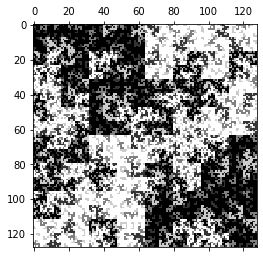

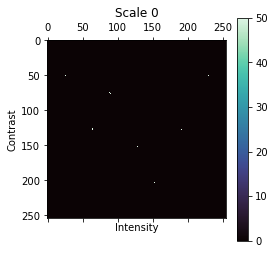

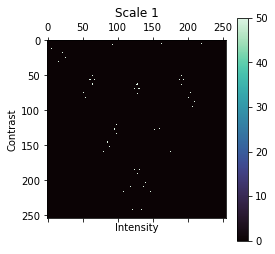

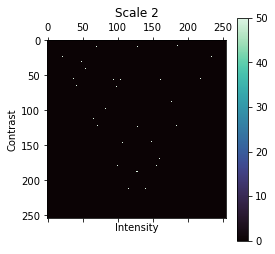

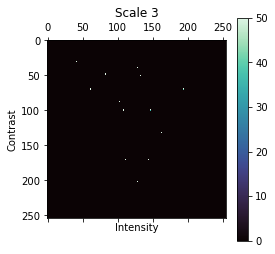

...

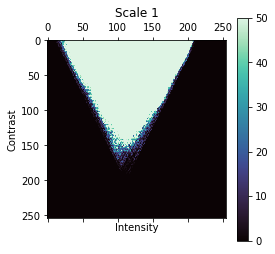

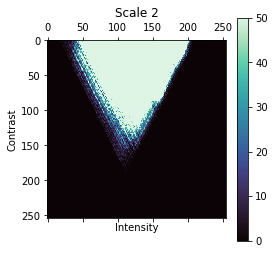

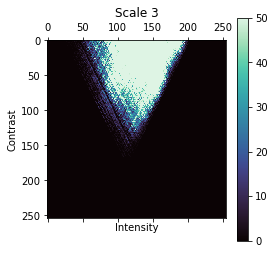

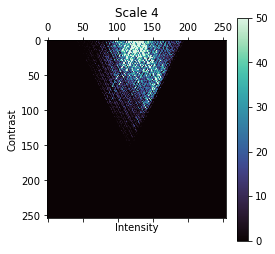

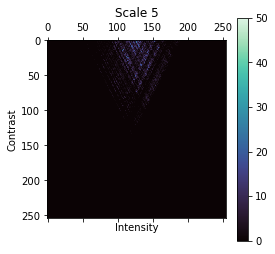

In [92]:
for img in imgs:
    # fig = plt.figure(figsize=(3,3))
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=255, contrast_k=255)
        plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp)
        plt.show()
        scale += 1

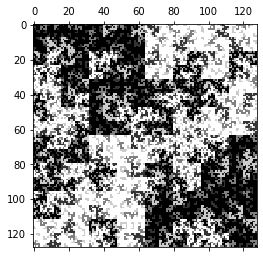

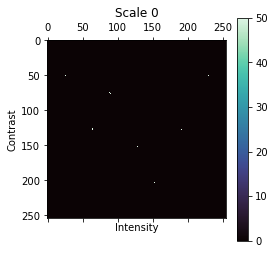

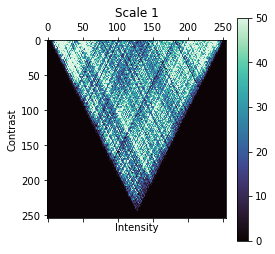

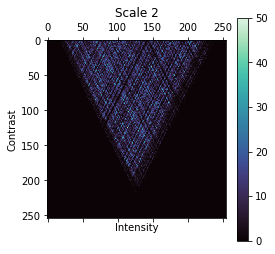

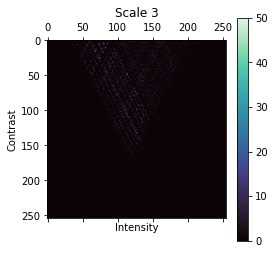

...

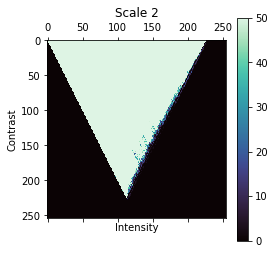

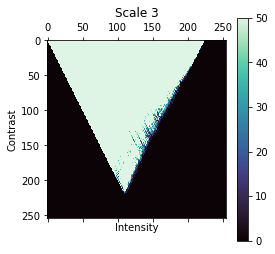

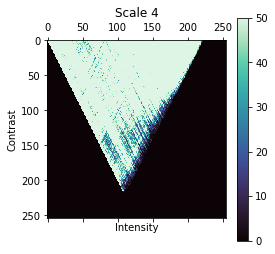

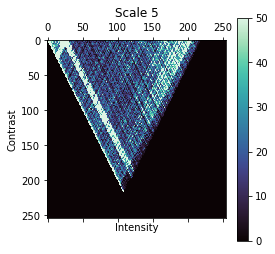

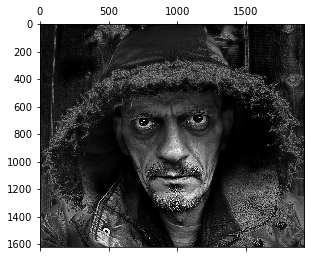

KeyboardInterrupt: 

In [94]:
for img in imgs:
    # fig = plt.figure(figsize=(3,3))
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=255, contrast_k=255)
        plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp, 1.4)
        plt.show()
        scale += 1

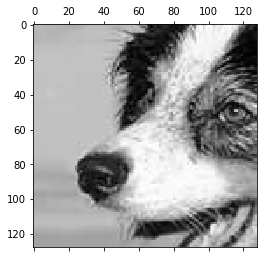

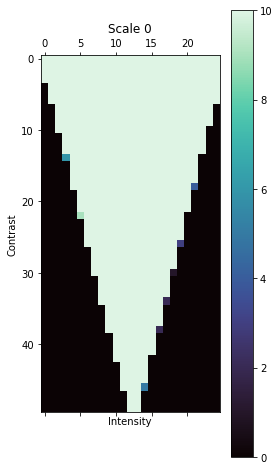

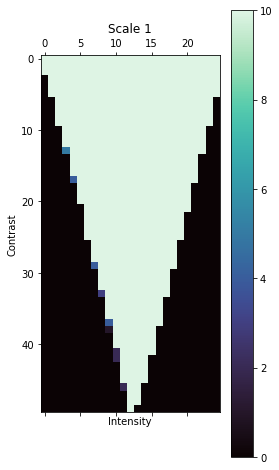

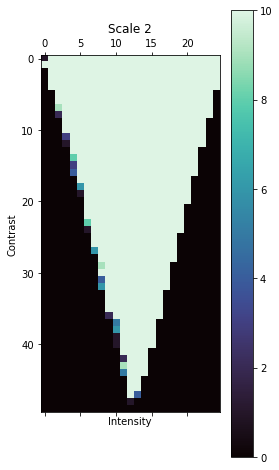

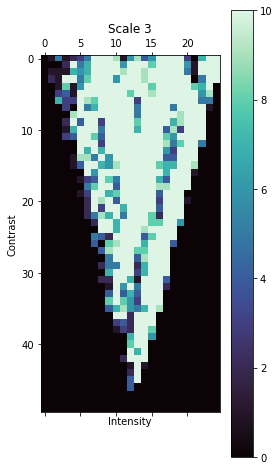

...

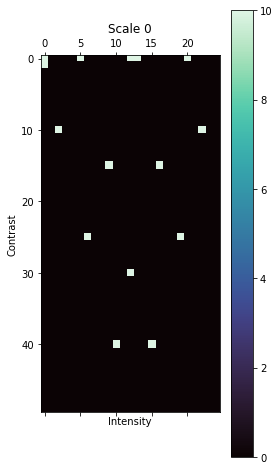

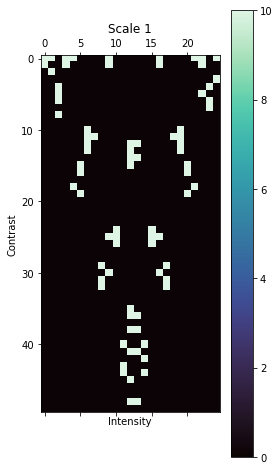

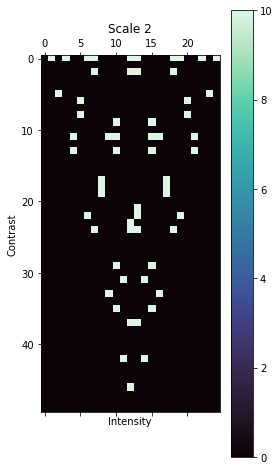

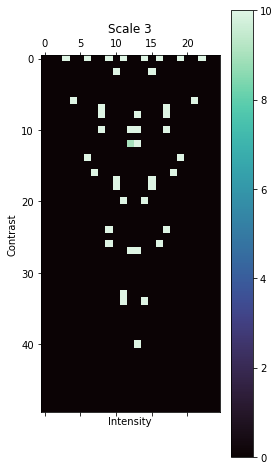

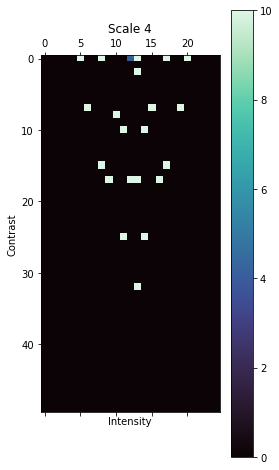

In [104]:
for img in [imgs[2][300:428, 440:568], imgs[0]]:
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=25, contrast_k=50)
        plt.matshow(hist, vmin=0, vmax=10, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp, 1.4)
        plt.show()
        scale += 1